# Exploring Public Sentiment on Twitter: An NLP Approach

Sentiment analysis is essential to learn how businesses and researchers grasp public opinion and allows real-time tracking of general sentiment toward 
products, services, events, or trending topics. Especially in platforms like X (formerly Twitter), with its wealth of user opinions, sentiment 
analysis is essential in understanding the social media landscape.

In this project, we will learn how to analyze sentiments on Twitter by focusing on a dataset containing more than 100,000 opinions about COVID-19 
from users worldwide.

The challenge lies in managing and interpreting a diverse collection of text data. With Python, and libraries like pandas and NLTK, we will learn to 
process the raw, unstructured Twitter data and turn it into an organized format suitable for analysis. Next, we will familiarize ourselves with 
the VADER sentiment analysis designed for the intricacies of social media language.

By the end of this project, we will be able to analyze global sentiments about COVID-19 and skillfully visualize COVID-19 data. 



## Part 1: Setting Up

In [1]:
# Importing InteractiveShell from IPython.core.interactiveshell module
from IPython.core.interactiveshell import InteractiveShell

# Setting the ast_node_interactivity option of InteractiveShell to "all"
# This allows IPython to display results for all statements in a code cell
# rather than just the last one, which is the default behavior.
InteractiveShell.ast_node_interactivity = "all"

import warnings
import matplotlib

# Suppress the specific MatplotlibDeprecationWarning
warnings.filterwarnings("ignore", category=matplotlib.cbook.MatplotlibDeprecationWarning)

/tmp/ipykernel_122/2357816857.py:13: MatplotlibDeprecationWarning: MatplotlibDeprecationWarning was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use matplotlib.MatplotlibDeprecationWarning instead.
  warnings.filterwarnings("ignore", category=matplotlib.cbook.MatplotlibDeprecationWarning)


### Task 1: Import the Libraries

In this task, we will start by importing the Python modules used in the project. To complete this task, import the following libraries:

1. os: A module for interacting with the operating system, facilitating file and directory manipulation.

2. re: A module for processing strings using regular expressions.

3. pandas: A library for data manipulation and analysis that uses robust data structures.

4. numpy: A library for numerical operations, especially on large arrays and matrices.

5. seaborn: A library for creating informative and attractive statistical visualizations.
    
6. matplotlib: A library for creating static, animated, or interactive visualizations.
    
7. nltk: The Natural Language Toolkit library containing a set of libraries and programs for symbolic and statistical 
natural language processing (NLP) of the English language.

8. sklearn: A machine learning library featuring various algorithms and tools.

9. plotly_express: A high-level interface for drawing attractive and informative graphics using the Plotly library.

10. genesis: A library for topic modeling and document similarity analysis.
    
11. pyLDAvis: A Python library for interactive topic model visualization. It can be used in conjunction with a variety of topic modeling packages.
    
12. wordcloud: A library for generating word clouds.
                    
13. nbconvert: A tool for converting Jupyter notebooks to HTML, LaTeX, PDF, Markdown, and more.
                 

In [2]:
import os  
import re 
import pandas as pd  
import numpy as np 
import seaborn as sns  
import matplotlib.pyplot as plt 
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
import plotly_express as px
from gensim.corpora import Dictionary
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel
import pyLDAvis.gensim
from wordcloud import WordCloud
import nbconvert

## Part 2: Data Collection and Preprocessing

After importing the relevant Python packages for this project, you’ll load the data—in this case, the covid19_twitter_dataset.csv file in 
the /usercode directory.

The dataset is obtained from kaggle. Before including the dataset in the project, it was preprocessed to include additional information such
as “language,” “latitude,” “longitude,” and “country” to increase the scope of the project.

The dataset consists of the following columns:

user_name: The Twitter user posting the tweet.

user_location: The location provided by the user in their Twitter profile.
    
user_description: The self-description provided by the Twitter user in their profile.

user_created: The date and time of when the user’s Twitter account was created.

user_followers: The number of followers of the Twitter user.
    
user_friends: The number of other Twitter users that the user follows.

user_favourites: The number of tweets marked by the user as their favorites.

user_verified: This indicates if Twitter has verified the user’s account.

date: The date and time of when the tweet was posted.

text: The content of the tweet.

hashtags: The hashtags used in the tweet.

source: The device or application used to post the tweet.

is_retweet: This indicates if the tweet is a retweet of another user’s tweet.
    
language: The identified language of the tweet.
    
lat: The latitude coordinate of the location from which the tweet is posted, if available.

long: The longitude coordinate of the location from which the tweet is posted, if available.

country: The country from where the tweet is posted, if available.

To complete this task, perform the following steps:

1. Load the dataset into a variable named df_twitter.

2. Display the DataFrame along with the row count.

3. Show the tweet count for the top 10 countries.
                       
4. Plot the top 20 users who post the most.



### Task 2: Load the Dataset and Have a First Look

##### Load the CSV into a variable named `df_twitter`

In [3]:
df_twitter = pd.read_csv('./usercode/covid19_twitter_dataset.csv', index_col=0)

##### Display the DataFrame along with the row count

In [4]:
df_twitter.head()
df_twitter.shape

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,language,lat,long,country
0,Tom Basile 🇺🇸,"new york, ny","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,en,40.712728,-74.006015,United States
1,Time4fisticuffs,"pewee valley, ky",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,en,38.310625,-85.487459,United States
2,DIPR-J&K,jammu and kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,en,33.664930,75.162958,India
3,🎹 Franz Schubert,новоро́ссия,🎼 #Новоро́ссия #Novorossiya #оставайсядома #S...,2018-03-19 16:29:52,1180,1071,1287,False,2020-07-25 12:27:06,#coronavirus #covid19 deaths continue to rise....,"['coronavirus', 'covid19']",Twitter Web App,False,en,43.341088,132.625674,Россия
5,Creativegms,"dhaka,bangladesh","I'm Motalib Mia, Logo -Logo Designer - Brandin...",2020-01-12 09:03:01,241,1694,8443,False,2020-07-25 12:26:50,Order here: https://t.co/4NUrGX6EmA\n\n#logo #...,"['logo', 'graphicdesigner', 'logodesign', 'log...",Twitter Web App,False,en,23.764402,90.389015,বাংলাদেশ


(111973, 17)

In [5]:
df_twitter.columns

Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet', 'language', 'lat',
       'long', 'country'],
      dtype='object')

##### Show the tweet count for the top 10 countries

In [6]:
df_twitter['country'].value_counts()[:10]

United States     41931
India             19473
United Kingdom    11544
Canada             6679
Australia          4370
Nigeria            2632
South Africa       2415
Éire / Ireland     1545
Kenya              1493
中国                 1141
Name: country, dtype: int64

##### Plot the top 20 users who post the most

<Axes: >

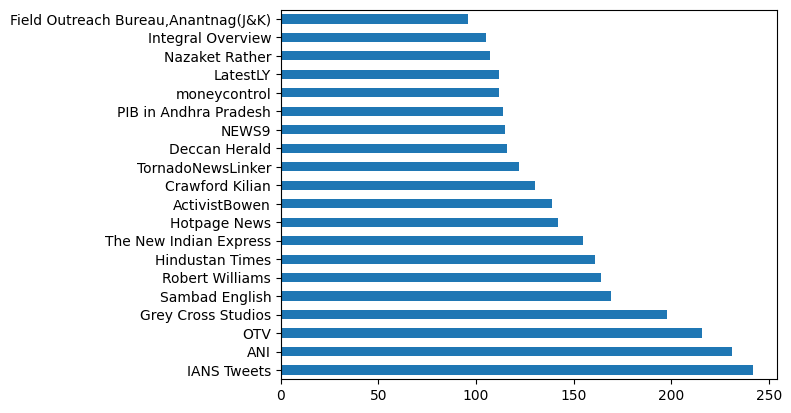

In [7]:
df_twitter['user_name'].value_counts()[:20].plot(kind='barh')

### Task 3: Basic Text Preprocessing

A typical next step in a data science project is data preprocessing.

To complete this task, perform the following data preprocessing steps:

1. Remove the following unneeded columns to simplify the data:

user_description

user_created

user_favourites

language

2. Check for missing data and fill in those values with the appropriate information.

3. Convert the date column to a datetime object and extract specific features, such as the year, month, day, hour, and day_of_week.

4. Implement a function called basic_clean_text(), which takes a text as input and applies the following text preprocessing techniques to it:

Converts to lowercase

Removes extra whitespace

Removes URLs

Removes HTML tags

Removes non-alphanumeric characters

Removes punctuation

Removes numbers



##### Remove unnecessary columns for the analysis

In [8]:
df_twitter.drop(['user_description','user_created','user_favourites','language'], axis=1, inplace=True)

##### Check for missing values and handle them

In [9]:
df_twitter.isnull().sum() # to check for missing values

# Fill missing values in 'hashtags' with an empty list
df_twitter['hashtags'].fillna("[]", inplace=True)

user_name             0
user_location         0
user_followers        0
user_friends          0
user_verified         0
date                  0
text                  0
hashtags          32184
source                0
is_retweet            0
lat                   0
long                  0
country               0
dtype: int64

##### Convert `date` column to datetime object and extract features

In [10]:
df_twitter['date'] = pd.to_datetime(df_twitter['date'])
df_twitter['year'] = df_twitter['date'].dt.year
df_twitter['month'] = df_twitter['date'].dt.month
df_twitter['day'] = df_twitter['date'].dt.day
df_twitter['hour'] = df_twitter['date'].dt.hour
df_twitter['day_of_week'] = df_twitter['date'].dt.dayofweek

In [11]:
df_twitter.head()

,user_name,user_location,user_followers,user_friends,user_verified,date,text,hashtags,source,is_retweet,lat,long,country,year,month,day,hour,day_of_week
0,Tom Basile 🇺🇸,"new york, ny",2253,1677,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,[],Twitter for Android,False,40.712728,-74.006015,United States,2020,7,25,12,5
1,Time4fisticuffs,"pewee valley, ky",9275,9525,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,38.310625,-85.487459,United States,2020,7,25,12,5
2,DIPR-J&K,jammu and kashmir,101009,168,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,33.664930,75.162958,India,2020,7,25,12,5
3,🎹 Franz Schubert,новоро́ссия,1180,1071,False,2020-07-25 12:27:06,#coronavirus #covid19 deaths continue to rise....,"['coronavirus', 'covid19']",Twitter Web App,False,43.341088,132.625674,Россия,2020,7,25,12,5
5,Creativegms,"dhaka,bangladesh",241,1694,False,2020-07-25 12:26:50,Order here: https://t.co/4NUrGX6EmA\n\n#logo #...,"['logo', 'graphicdesigner', 'logodesign', 'log...",Twitter Web App,False,23.764402,90.389015,বাংলাদেশ,2020,7,25,12,5


##### Apply `basic_clean_text()` function to `text` column

In [12]:
def basic_clean_text(text):
    # Convert to lowercase
    text = text.lower()
    
    # Remove extra whitespace
    text = re.sub(r" +", ' ', text, flags=re.MULTILINE)
    
    # Remove URLs
    text = re.sub(r"http\S+|www\S+|https\S+", '', text, flags=re.MULTILINE)
    
    # remove HTML tags
    text = text.replace('<.*?>', '')  
    
     # remove non-alphanumeric characters
    text = text.replace('[^A-Za-z0-9 ]+', '') 
    
    # Remove punctuation
    text = re.sub(r'[^\w\s]', '', text)
    
    # Remove numbers
    text = re.sub(r'\d+', '', text)
    
    return text

df_twitter['text'] = df_twitter['text'].apply(basic_clean_text)

In [13]:
df_twitter['text'].head()

0    hey yankees yankeespr and mlb  wouldnt it have...
1    diane wdunlap realdonaldtrump trump never once...
2     july  media bulletin on novel coronavirusupda...
3    coronavirus covid deaths continue to rise its ...
5    order here \n\nlogo graphicdesigner logodesign...
Name: text, dtype: object

### Task 4: Implement Advanced Text Preprocessing

Now, you’ll implement advanced text preprocessing techniques to refine the data before further analysis.

To complete this task, perform the following tasks:

1. Break down the text into individual words or tokens for analysis (tokenization).
                                                   
2. Remove common words like “the,” “is,” and “in” to focus on the most relevant content. This is known as stop word removal.
                                   
3. Reduce the words to their base or root form to avoid redundancy. For example, “Songs” becomes “Song” and “Texts” becomes “Text.” This is known 
as stemming.



##### Apply `advanced_text_preprocessing()` function to `text` column

In [14]:
def advanced_text_preprocessing(text):
    # Tokenization
    tokens = word_tokenize(text)

    # Stopword Removal
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens if word.lower() not in stop_words]

    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(word) for word in filtered_tokens]

    # Join tokens back to form the preprocessed text
    preprocessed_text = " ".join(lemmatized_tokens)

    return preprocessed_text

df_twitter['text'] = df_twitter['text'].apply(advanced_text_preprocessing)

In [15]:
df_twitter['text'].head()

0    hey yankee yankeespr mlb wouldnt made sense pl...
1    diane wdunlap realdonaldtrump trump never clai...
2    july medium bulletin novel coronavirusupdates ...
3    coronavirus covid death continue rise almost b...
5    order logo graphicdesigner logodesign logodesi...
Name: text, dtype: object

## Part 3: Sentiment Analysis


### Task 5: Perform Sentiment Analysis with Vader Library

In this task, you’ll analyze the sentiment of the tweets using a pretrained model called VADER. Unlike traditional supervised learning models, 
using VADER is convenient because it requires no training data. It can accurately understand the sentiment of texts containing emoticons, slang, 
and conjunctions shared in social media communication.

VADER provides a probability score for each input sentence, indicating whether it is positive, negative, or neutral. This allows you to gauge the
sentiment of your Twitter data effectively. By leveraging the power of VADER, you can gain valuable insights into the sentiments expressed in your
Twitter data without the need for extensive manual labeling or training data.

To complete this task, perform the following steps:

1. Initialize VADER.

2. Save sentiment scores for each tweet in the text column in a new column called sentiment_scores.
    
3. Display a random sample of 10 values of the sentiment_scores and text columns.



##### Perform sentiment analysis with vader library

In [16]:
# Initialize VADER
sid = SentimentIntensityAnalyzer()

# Get sentiment scores for each tweet
df_twitter['sentiment_scores'] = df_twitter['text'].apply(lambda x: sid.polarity_scores(x))

##### Display a random sample of 10 tweets with their sentiment scores

In [17]:
df_twitter[['text','sentiment_scores']].sample(10).values

array([['total number covid test conducted far lagos stand confirmed case',
        {'neg': 0.0, 'neu': 0.874, 'pos': 0.126, 'compound': 0.0772}],
       ['mron rahulgandhi done parliamentary constituency help citizen covid',
        {'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}],
       ['madurai crossing covid case death rate highest tamilnadu higher chennai well',
        {'neg': 0.26, 'neu': 0.6, 'pos': 0.14, 'compound': -0.4215}],
       ['covid ucsandiego chronicle august ucsdhealth number continue improve week',
        {'neg': 0.0, 'neu': 0.625, 'pos': 0.375, 'compound': 0.4939}],
       ['dpharmaplc serestx well done involved waiting eagerly news whether microbiome worki',
        {'neg': 0.0, 'neu': 0.657, 'pos': 0.343, 'compound': 0.5719}],
       ['beautiful nurse heart stopped beating covid striked mirian awour adumba put go',
        {'neg': 0.275, 'neu': 0.506, 'pos': 0.219, 'compound': 0.0}],
       ['today covid update ohio live today tie hiramcollege',


### Task 6: Classify the Tweets into Positive, Neutral and Negative

In Task 5, you discovered that the VADER library provides a compound key in the sentiment analysis result dictionary. The value of the key is a 
continuous compound value ranging from -1 to 1, instead of explicit sentiment labels like “Positive,” “Neutral,” or “Negative.” The goal of this 
task is to replace the values with sentiment labels.

To complete this task, perform the following steps:

1. Set a threshold value to classify sentiment scores into distinct categories, such as “Positive,” “Neutral,” and “Negative.”

2. Compare the compound score obtained in Task 5 with the threshold value and assign the appropriate sentiment label to each tweet.

3. Print the sentiment distribution.

N.B : continuous scale classification is a unique characteristic of VADER. The compound value represents the overall sentiment, with positive values
indicating a more positive sentiment, negative values indicating a more negative sentiment, and values close to 0 suggesting a neutral sentiment.



##### Classify the tweets into categories of positive, negative, or neutral sentiment

In [18]:
threshold_value = 0.0

# Get sentiment based on the compound score
df_twitter['sentiment'] = df_twitter['sentiment_scores'].apply(lambda x: 'positive' if x['compound'] > threshold_value else ('neutral' if x['compound'] == threshold_value else 'negative'))

# Print the sentiment distribution
print(df_twitter['sentiment'].value_counts())

positive    45225
negative    33807
neutral     32941
Name: sentiment, dtype: int64


## Part 4: Trend Analysis and Visualization

### Task 7: Display the Evolution of Sentiment Over Time

In this task, you’ll make a line chart that shows how sentiments changed over time in the top three active countries.

To complete this task, perform the following steps:

1. Extract the top three countries to be used as a filter and save them in a list.

2. Create a new DataFrame called filtered_data based on the list containing the three top countries.
    
3. Compute a DataFrame with the sentiment counts over time by country.

4. Plot the top three countries’ sentiments over time.


##### Extract the top 3 countries to be used as a filter

In [19]:
# Identifying the 3 most active countries based on the number of tweets
most_active_countries = df_twitter['country'].value_counts().nlargest(3).index.tolist()
most_active_countries

['United States', 'India', 'United Kingdom']

##### Filter the DataFrame

In [20]:
# Filtering the data to include only the 3 most active countries
filtered_data = df_twitter[df_twitter['country'].isin(most_active_countries)]
filtered_data.shape

(72948, 20)

##### Create sentiment over time by country based on `groupby`

In [21]:
sentiment_over_time_by_country = filtered_data.groupby([pd.Grouper(key='date', freq='D'), 'country'])['sentiment'].value_counts().unstack().fillna(0).reset_index()

# Melt the DataFrame to have a 'sentiment' column and a 'count' column
sentiment_melted = sentiment_over_time_by_country.melt(id_vars=['date', 'country'], value_vars=['negative', 'neutral', 'positive'], var_name='sentiment', value_name='count')

In [22]:
sentiment_melted.head()

,date,country,sentiment,count
0,2020-07-24,India,negative,1.0
1,2020-07-24,United Kingdom,negative,4.0
2,2020-07-24,United States,negative,49.0
3,2020-07-25,India,negative,449.0
4,2020-07-25,United Kingdom,negative,328.0


##### Plot the top three countries sentiments over time

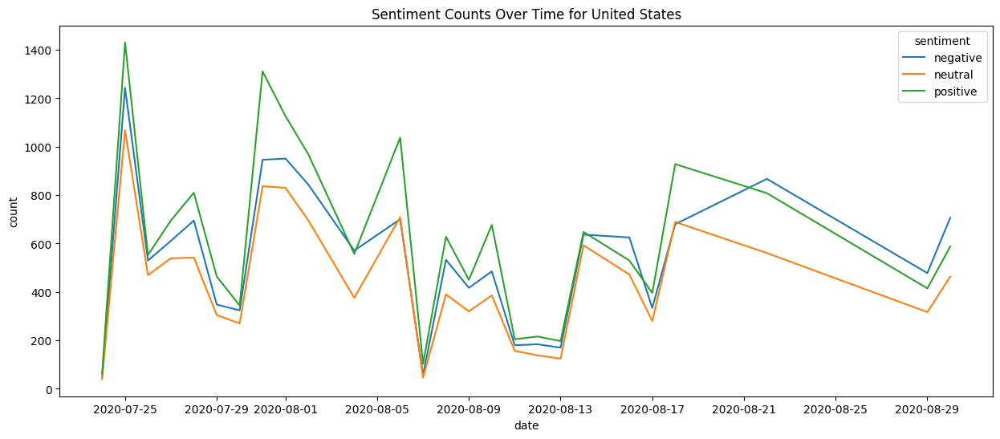

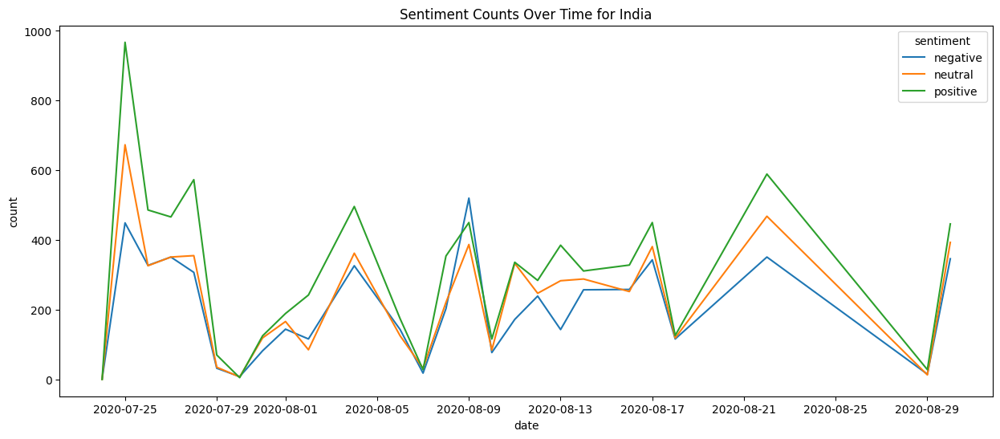

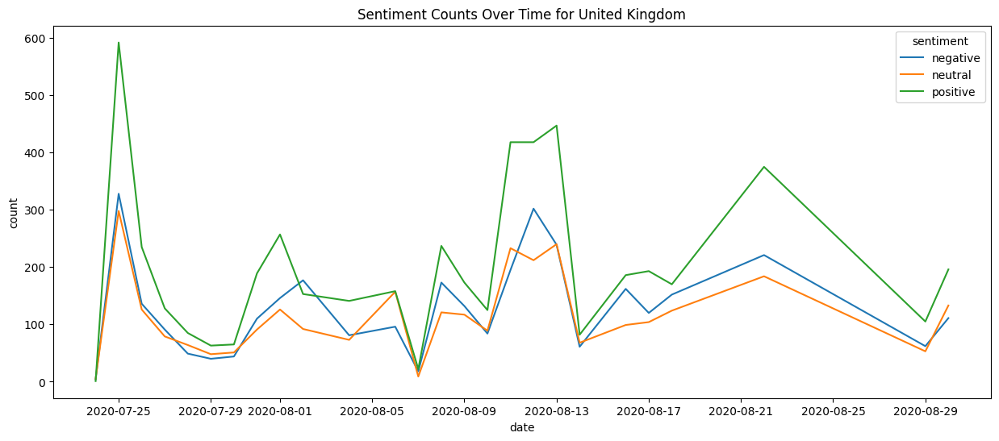

In [23]:
# For each country, create a separate plot
for country in most_active_countries:
    _ = plt.figure(figsize=(15, 6))
    _ = sns.lineplot(data=sentiment_melted[sentiment_melted['country'] == country], x="date", y="count", hue="sentiment")
    _ = plt.title(f'Sentiment Counts Over Time for {country}')
    _ = plt.show()

### Task 8: Use Wordcloud to Visualize Words Used in Sentiments

In this task, you’ll explore a word cloud—a powerful and visually appealing way to understand the most frequently used words in different sentiments.

To complete this task, perform the following steps:

1. Group the preprocessed text data based on their sentiment labels. This will help you visualize the word frequency separately for positive, negative,
and neutral sentiments.
                                                                                                                               
2. Create a word cloud for each sentiment group. Use a word cloud library, such as wordcloud in Python, to generate word clouds.
    
3. Display the generated word clouds for the positive, negative, and neutral sentiments. Analyze the results and observe each sentiment category’s 
most frequently used words.



##### Define the `create_word_cloud()` function

In [24]:
# Function to create word cloud for a given sentiment
def create_word_cloud(sentiment):
    # Filtering the text based on the given sentiment
    text = ' '.join(df_twitter[df_twitter['sentiment'] == sentiment]['text'].values)
    
    # Creating the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Plotting the word cloud
    plt.figure(figsize=(15, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f'Word Cloud for {sentiment.capitalize()} Sentiments')
    plt.show()

##### Creating word cloud for positive sentiment

/usr/local/lib/python3.8/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


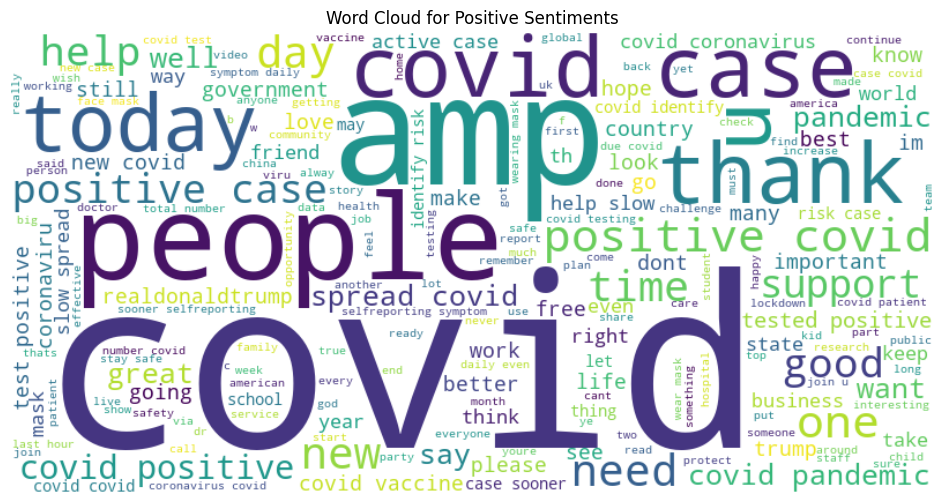

In [25]:
create_word_cloud('positive')

##### Creating word cloud for negative sentiment

/usr/local/lib/python3.8/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


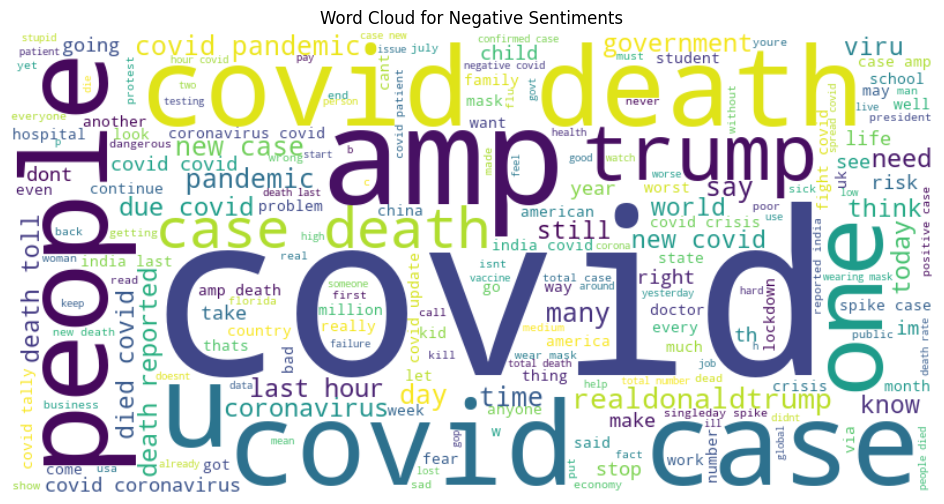

In [26]:
create_word_cloud('negative')

##### Creating word cloud for neutral sentiment

/usr/local/lib/python3.8/dist-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


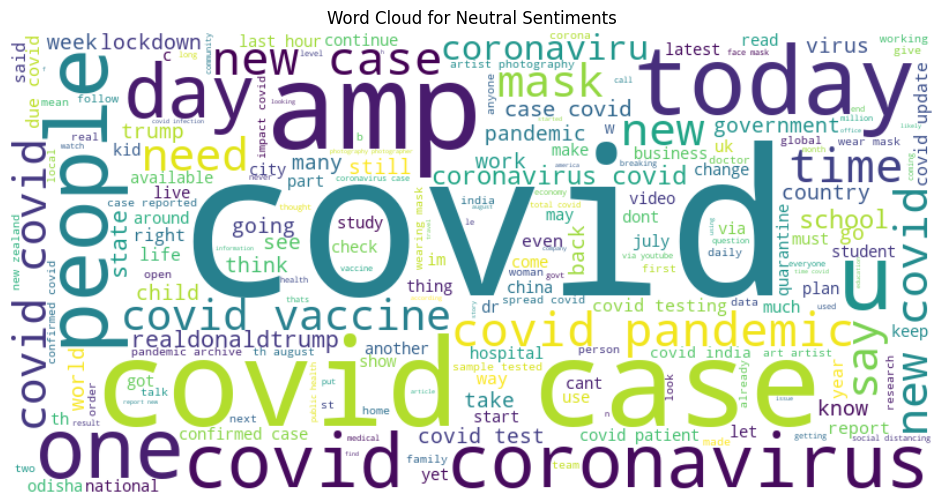

In [27]:
create_word_cloud('neutral')

### Task 9: Display the Sentiment on a Geographical Heatmap

In this task, you’ll create an interactive visualization called a geographical heatmap. You can create engaging and informative data visualization 
by incorporating the tweets’ geographical information (lat and long). This animated map will provide insights into how sentiments evolve 
across different locations to present a dynamic representation of sentiment trends.

To complete this task, perform the following steps:

1. Map the calculated sentiment labels to numerical codes 1, 0, and -1 assigned to the positive, neutral, and negative sentiments, respectively. Save
it as a new column in the DataFrame.
    
2. Create the following graph to use the density_mapbox() function from the px import of the plotly_express Python library. To simplify this task,
a part of the code is provided where you only need to replace ??? with the right information.



##### Create mapping from positive, neutral and negative to an numerical value for visualization purpose

In [28]:
sentiment_mapping = {'positive': 1, 'neutral': 0, 'negative': -1}
df_twitter['sentiment_value'] = df_twitter['sentiment'].map(sentiment_mapping)

In [29]:
df_twitter.head()

,user_name,user_location,user_followers,user_friends,user_verified,date,text,hashtags,source,is_retweet,...,long,country,year,month,day,hour,day_of_week,sentiment_scores,sentiment,sentiment_value
0,Tom Basile 🇺🇸,"new york, ny",2253,1677,True,2020-07-25 12:27:17,hey yankee yankeespr mlb wouldnt made sense pl...,[],Twitter for Android,False,...,-74.006015,United States,2020,7,25,12,5,"{'neg': 0.112, 'neu': 0.64, 'pos': 0.248, 'com...",positive,1
1,Time4fisticuffs,"pewee valley, ky",9275,9525,False,2020-07-25 12:27:14,diane wdunlap realdonaldtrump trump never clai...,['COVID19'],Twitter for Android,False,...,-85.487459,United States,2020,7,25,12,5,"{'neg': 0.0, 'neu': 0.832, 'pos': 0.168, 'comp...",positive,1
2,DIPR-J&K,jammu and kashmir,101009,168,False,2020-07-25 12:27:08,july medium bulletin novel coronavirusupdates ...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,...,75.162958,India,2020,7,25,12,5,"{'neg': 0.0, 'neu': 0.796, 'pos': 0.204, 'comp...",positive,1
3,🎹 Franz Schubert,новоро́ссия,1180,1071,False,2020-07-25 12:27:06,coronavirus covid death continue rise almost b...,"['coronavirus', 'covid19']",Twitter Web App,False,...,132.625674,Россия,2020,7,25,12,5,"{'neg': 0.433, 'neu': 0.488, 'pos': 0.079, 'co...",negative,-1
5,Creativegms,"dhaka,bangladesh",241,1694,False,2020-07-25 12:26:50,order logo graphicdesigner logodesign logodesi...,"['logo', 'graphicdesigner', 'logodesign', 'log...",Twitter Web App,False,...,90.389015,বাংলাদেশ,2020,7,25,12,5,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",neutral,0


##### Visualize a geographical heatmap of all sentiment on the map

In [30]:
fig = px.density_mapbox(df_twitter, lat='lat', lon='long',
                        z='sentiment_value', radius=20,
                        center=dict(lat=df_twitter.lat.mean(), 
                                    lon=df_twitter.long.mean()), 
                        zoom=4,
                        mapbox_style="open-street-map", 
                        height=900)
fig.show()

## Part 5: Topic Modeling 

### Task 10: Train the LDA (Gensim) Model

In this task, you’ll implement a Latent Dirichlet Allocation (LDA) model to extract topics from the text corpus of the Twitter data. This process is
called topic modeling.

To complete this task, perform the following steps:

1. Start by preprocessing the text column of the df_twitter Dataframe. Transform the text to lowercase and split it into tokens (words), and then save
the result to a new column in the DataFrame called text_tokens.
    
2. Use the Gensim Dictionary class and create a dictionary from the text_tokens column. The Dictionary class transforms the words in the tweets into 
unique IDs.

3. Filter out tokens that are too rare or too common from the dictionary using the filter_extremes() method of the Dictionary object. In this case,
remove tokens that appear in less than two tweets and more than 99% of the tweets.
    
4. Convert the list of words (df_twitter['text_tokens']) into a corpus.
    
5. Create an LDA model using the LdaMulticore() class from gensim. This model will find five topics in the corpus.



##### Preprocess the text

In [31]:
df_twitter['text_tokens'] = df_twitter['text'].str.lower().str.split()

##### Create a dictionary

In [32]:
id2word = Dictionary(df_twitter['text_tokens'])

##### Filter extremes

In [33]:
id2word.filter_extremes(no_below=2, no_above=.99)

##### Create a corpus

In [34]:
corpus = [id2word.doc2bow(d) for d in df_twitter['text_tokens']]

##### Instantiate an LDA model 

In [35]:
base_model = LdaMulticore(corpus=corpus, num_topics=5, id2word=id2word, workers=12, 
passes=5)

### Task 11: Evaluate the Model

In this task, you’ll extract topics from the LDA model and then evaluate the topics’ quality using the perplexity and the coherence score.

To complete this task, perform the following steps:

1. Use the print_topics() method of the LDA model object to print the most significant words for each topic. The output is a list of tuples where the
first element is the topic ID and the second is a string of word probability pairs.
    
2. Take the first 10 words to represent the topic for each topic.
    
3. Loop through the topics and print each one. A string of 10 words represents each topic.
    
4. Compute the perplexity.
    
5. Compute the coherence score.

perplexity : Perplexity measures how well the probability distribution predicted by the model aligns with the actual distribution of the words in 
the corpus. A lower perplexity indicates the model is a better fit for the data.

cohorence score : The coherence score is another metric used to evaluate the quality of the topics generated by the LDA model.A higher coherence score 
indicates that the words in a topic co-occur more frequently, implying the topics are more interpretable.                                                                 

##### Print the topics

In [36]:
# Filtering for words 
words = [re.findall(r'"([^"]*)"',t[1]) for t in base_model.print_topics()]

# Create Topics
topics = [' '.join(t[0:10]) for t in words]

# Getting the topics
for id, t in enumerate(topics): 
    print(f"------ Topic {id} ------")
    print(t, end="\n\n")

------ Topic 0 ------
covid new case coronavirus death today amp people health first

------ Topic 1 ------
covid mask amp people u pandemic school coronavirus vaccine time

------ Topic 2 ------
covid amp one help trump realdonaldtrump people even know risk

------ Topic 3 ------
covid people pandemic like dont take get health u care

------ Topic 4 ------
covid case death india day last coronavirus new positive total



##### Compute the perplexity and coherence score

In [37]:
# Compute Perplexity
# a measure of how good the model is. lower the better
base_perplexity = base_model.log_perplexity(corpus)
print('\nPerplexity: ', base_perplexity) 

# Compute Coherence Score
coherence_model = CoherenceModel(model=base_model, texts=df_twitter['text_tokens'], 
                                   dictionary=id2word, coherence='c_v')
coherence_lda_model_base = coherence_model.get_coherence()
print('\nCoherence Score: ', coherence_lda_model_base)


Perplexity:  -8.413091135076575

Coherence Score:  0.3449902195784292


### Task 12: Classify Twitter Tweets into Topics

In this task, you’ll utilize the Latent Dirichlet Allocation (LDA) model you built to classify tweets into distinct topics. Then, we will examine the 
distribution of topics across the tweets in your dataset.

To complete this task, perform the following steps:

1. Create a function, classify_tweet(), that assigns a topic to a given tweet based on its content. This function will do the following:

Preprocess the tweet by converting it to lowercase and splitting it into words.
    
Transform the tokenized tweet into a bag-of-words (BoW) format using the predefined dictionary.

Use the LDA model to determine the probabilities of the tweet belonging to each topic.
    
Identify and return the topic with the highest probability.
    
2. Apply the classify_tweet() function to every tweet in your DataFrame and store the topic classifications in a new column.

3. Check the frequency of each topic in your DataFrame to understand the distribution and popularity.



##### Topic classification function

In [38]:
def classify_tweet(tweet):
    # Preprocess the tweet
    processed_tweet = tweet.lower().split()

    # Transform tweet into bag-of-words format
    tweet_bow = id2word.doc2bow(processed_tweet)

    # Get topic probabilities
    topic_probabilities = base_model.get_document_topics(tweet_bow)

    # Get the topic with the highest probability
    most_likely_topic = max(topic_probabilities, key=lambda x: x[1])

    return most_likely_topic[0]

##### Classify all tweets

In [39]:
df_twitter['topic'] = df_twitter['text'].apply(lambda x: classify_tweet(x)) 

In [40]:
df_twitter['topic'].value_counts()

1    26131
2    24087
4    21727
3    21562
0    18466
Name: topic, dtype: int64

##### Examine topic distribution

## Part 6: Interpretation of Results

### Task 13: Identify Relationships between Sentiment and Topic

In this task, you’ll analyze the sentiment distribution across different topics from the DataFrame of the tweets. By the end of this task, you’ll be 
able to visualize the proportion of sentiments (positive, neutral, and negative) associated with each topic and interpret these proportions to gain
insights.

To complete this task, perform the following steps:

1. Group the tweets by topic and sentiment.

2. Calculate the proportion of sentiments for each topic.

3. Visualize the results as shown in the image below.



##### Grouping and aggregating data by topic and sentiment

In [41]:
grouped = df_twitter.groupby(['topic', 'sentiment']).size().unstack(level='sentiment')
print(grouped)

sentiment  negative  neutral  positive
topic                                 
0              5188     6813      6465
1              5369     7941     12821
2              7930     5916     10241
3              7379     5084      9099
4              7941     7187      6599


##### Calculating proportions

In [42]:
percent_grouped = grouped.divide(grouped.sum(axis=1), axis=0)
print(percent_grouped)

sentiment  negative   neutral  positive
topic                                  
0          0.280949  0.368948  0.350103
1          0.205465  0.303892  0.490643
2          0.329223  0.245610  0.425167
3          0.342222  0.235785  0.421992
4          0.365490  0.330787  0.303723


##### Visualizing the results

<Axes: xlabel='topic'>

Text(0.5, 0, 'Topic')

Text(0, 0.5, 'Proportion of Tweets')

Text(0.5, 1.0, 'Proportion of Sentiments by Topic')

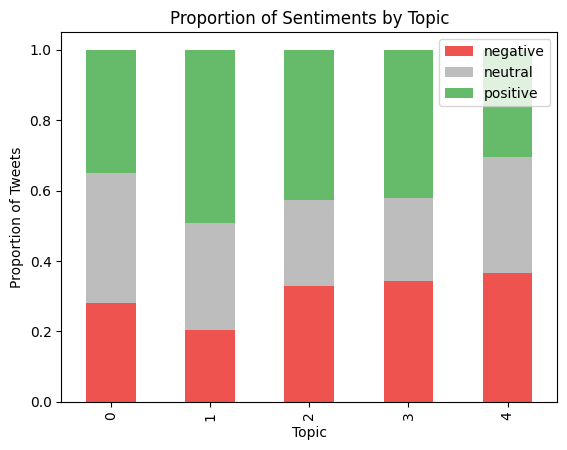

In [43]:
# Assign the colors based on your data's columns (assuming the columns of percent_grouped are 'positive', 'neutral', and 'negative')
palette = {'positive': '#66BB6A', 'neutral': '#BDBDBD', 'negative': '#EF5350'}
colors = [palette[col] for col in percent_grouped.columns]

percent_grouped.plot(kind='bar', stacked=True, color=colors)
plt.xlabel('Topic')
plt.ylabel('Proportion of Tweets')
plt.title('Proportion of Sentiments by Topic')
plt.legend(loc='upper right')
plt.show()

### Task 14: Interpret the Topic Modeling Results

In this task, you’ll use the pyLDAvis library to create a visualization that displays the distance between the topics identified in the dataset of the
tweets. This visualization can offer valuable insights into distinct topics and their relative prominence in the dataset.

To complete this task, use the prepare() function from pyLDAvis.gensim to process the LDA model, the corpus, and the dictionary. This function returns
a visualization you can view directly in your notebook.

NB: Each topic is represented by a bubble whose size indicates the topic’s prominence in the dataset. The distance between the bubbles suggests how 
similar or distinct the topics are from one another.

check the html page , it will look like below : 

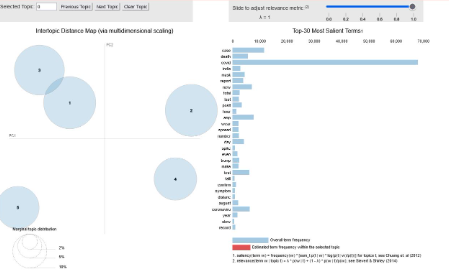



##### Creating topic distance visualization

In [44]:
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(base_model, corpus, id2word)

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.063803 -0.116149       1        1  22.732900
2     -0.079745  0.071412       2        1  20.982194
4      0.162051  0.026951       3        1  20.255705
3     -0.086817  0.047046       4        1  18.819306
0      0.068314 -0.029260       5        1  17.209895, topic_info=          Term          Freq         Total Category  logprob  loglift
125       case  11828.000000  11828.000000  Default  30.0000  30.0000
163        new   6956.000000   6956.000000  Default  29.0000  29.0000
32       death   5915.000000   5915.000000  Default  28.0000  28.0000
713      india   3190.000000   3190.000000  Default  27.0000  27.0000
479       last   2443.000000   2443.000000  Default  26.0000  26.0000
...        ...           ...           ...      ...      ...      ...
310   pandemic    653.837721   4551.643034   Topic5  -5.6739  -0.1807
193         th    506.039682   1954.756282   Topic5  -5.9301   0.4083
673       test    518.311627   2833.439698   Topic5  -5.9062   0.0610
1334    august    506.708689   2096.292545   Topic5  -5.9288   0.3397
178          u    508.549753   5109.596416   Topic5  -5.9252  -0.5476

[482 rows x 6 columns], token_table=       Topic      Freq           Term
term                                 
845        1  0.008186         active
845        2  0.007017         active
845        3  0.523928         active
845        4  0.026898         active
845        5  0.433878         active
...      ...       ...            ...
4442       4  0.003328        zealand
4442       5  0.948491        zealand
4778       4  0.959651         zombie
4778       5  0.023406         zombie
23868      5  0.980501  अनत_हगड_मफ_मग

[1330 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 5, 4, 1])

### Task 15: Compile your Findings into a Final Report with NBConvert

##### Execute the command within the provided notebook cell

In [45]:
!jupyter nbconvert --to html ../usercode/CovidSentimentAnalyzer.ipynb

[NbConvertApp] Converting notebook ../usercode/CovidSentimentAnalyzer.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 8 image(s).
[NbConvertApp] Writing 8974496 bytes to ../usercode/CovidSentimentAnalyzer.html
